<a href="https://colab.research.google.com/github/Gabriel-R-A/Final_exam_of_Fundamentals_of_Deep_Learning/blob/main/Prova_Fundamentos_Deep_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Pós-graduação em Ciência de Dados e Machine Learning

#### Disciplina: **Fundamentos de Deep Learning**

#### Projeto Final para disciplina Fundamentos de Deep Learning

<BR>
    

#### Nome: Gabriel Rodrigues Alves
#### RA: 52200040



### **Descrição do Problema**

Descreva o problema que deseja resolver com machine learning fazendo um breve resumo do dataset. Utilizem algum dataset que não foi tratado no decorrer do curso. Seria interessante que a base de dados seja referente a algum caso real.

Em seguida, expliquem o porque escolheram o algoritmo de machine learning que vão usar para solucionar o problema. 

Seguem alguns sites para download de datasets:

http://archive.ics.uci.edu/ml/index.php

https://www.kaggle.com/

https://dados.gov.br/dataset

- Foi usado um dataset do Kaggle que apresenta imagens de ambientes naturais em todo mundo.
- São 25 mil imagens de tamanho 150x150 distribuído em 6 categorias que são:
>> - buildings = 0 
>> - forest = 1
>> - glacier = 2
>> - mountain = 3
>> - sea = 4
>> - street = 5

- os dados estão divididos entre pastas de treino, teste e validação

----

- A Kaggle dataset was used that presents images of natural environments around the world.
- There are 25 thousand images of size 150x150 distributed in 6 categories that are:
>> - buildings = 0
>> - forest = 1
>> - glacier = 2
>> - mountain = 3
>> - sea = 4
>> - street = 5

- the data is divided between training, testing and validation folders

---
---

### **Algoritmo**

Qual o motivo da escolha do algoritmo para resolver este problema ?

- O dataset foi escolhido pois são dados variados e que podem ser explorados de varias formas, nesse caso foi usado o mesmo dataset e construido uma CNN para classificar as imagens de ambientes diversos e também uma GAN para tentar gerar imagens de um ambiente especifico.
---
- The dataset was chosen because it is varied data and can be explored in different ways, in this case the same dataset was used and a CNN was built to classify the images of different environments and also a GAN to try to generate images of a specific environment.

### **Dataset**
- Essas linhas abaixo são da API do kaggle, tudo foi baixado diretamente dela, e usado a credencial da conta para poder acessar os dados.
- Caso não saibam como usar API do kaggle colocarei um link para um video tutoria que explica passo a passo como usar a API do site: https://youtu.be/yEXkEUqK52Q
- Caso o metodo do kaggle não funcione é possivel baixar os dados no link: https://www.kaggle.com/datasets/puneet6060/intel-image-classification

---
---
- These lines below are from the kaggle API, everything was downloaded directly from it, and used the account credential to access the data.
- If you don't know how to use kaggle's API, I'll link to a video tutorial that explains step by step how to use the site's API: https://youtu.be/yEXkEUqK52Q
-
If the kaggle method does not work, you can download the data from the link: https://www.kaggle.com/datasets/puneet6060/intel-image-classification

# Build GANs models for Sea landscape 

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [15]:
# caso não funcione dê um ! pip install kaggle
# entre na conta do kaggle, e baixe a chave acesso da api e deixe no drive.
# if it doesn't work give a ! pip install kaggle
# enter the kaggle account, and download the api access key and leave it in the drive.
! mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


Conectar com o MyDrive de cada usuário ----- IMPORTANTE -----

Connect with each user's MyDrive ----- IMPORTANT -----

---



In [16]:
! cp /content/drive/MyDrive/KAGGLE_API_CREDENTIAL/kaggle.json ~/.kaggle/kaggle.json

In [17]:
! chmod 600 ~/.kaggle/kaggle.json

In [18]:
! kaggle datasets download -d puneet6060/intel-image-classification  

 93% 322M/346M [00:01<00:00, 279MB/s]
100% 346M/346M [00:01<00:00, 256MB/s]


In [ ]:
! unzip intel-image-classification.zip

#### Importando bibliotecas /  Importing Libraries

In [20]:
import numpy as np
import os 
import matplotlib.pyplot as plt
import cv2
import uuid
import keras
import tensorflow as tf
import warnings
warnings.filterwarnings('ignore')
import random
import time
from tensorflow.keras.optimizers import Adam
from keras.models import Sequential, Model
from keras.layers import Dense, LeakyReLU, Reshape, Flatten, Input
from keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Conv2DTranspose

from tensorflow.compat.v1.keras.layers import BatchNormalization
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from keras.preprocessing.image import ImageDataGenerator
from PIL import Image
from tensorflow.keras.utils import plot_model
from psutil import virtual_memory
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from keras.layers import LeakyReLU


from tqdm import tqdm
from PIL import Image as Img
from keras.optimizers import RMSprop

#### Importando base e visualizando dados / Importing database and visualizing data


In [21]:
for dirpath, dirnames, filenames in os.walk("/content/seg_train/seg_train"):
  print(f"Existem {len(dirnames)} pastas e {len(filenames)} imagens em {dirpath}")

Existem 6 pastas e 0 imagens em /content/seg_train/seg_train
Existem 0 pastas e 2191 imagens em /content/seg_train/seg_train/buildings
Existem 0 pastas e 2404 imagens em /content/seg_train/seg_train/glacier
Existem 0 pastas e 2382 imagens em /content/seg_train/seg_train/street
Existem 0 pastas e 2512 imagens em /content/seg_train/seg_train/mountain
Existem 0 pastas e 2271 imagens em /content/seg_train/seg_train/forest
Existem 0 pastas e 2274 imagens em /content/seg_train/seg_train/sea


In [22]:
for dirpath, dirnames, filenames in os.walk("/content/seg_test/seg_test"):
  print(f"Existem {len(dirnames)} pastas e {len(filenames)} imagens em {dirpath}")

Existem 6 pastas e 0 imagens em /content/seg_test/seg_test
Existem 0 pastas e 437 imagens em /content/seg_test/seg_test/buildings
Existem 0 pastas e 553 imagens em /content/seg_test/seg_test/glacier
Existem 0 pastas e 501 imagens em /content/seg_test/seg_test/street
Existem 0 pastas e 525 imagens em /content/seg_test/seg_test/mountain
Existem 0 pastas e 474 imagens em /content/seg_test/seg_test/forest
Existem 0 pastas e 510 imagens em /content/seg_test/seg_test/sea


In [23]:
for dirpath, dirnames, filenames in os.walk("/content/seg_pred/seg_pred"):
  print(f"Existem {len(dirnames)} pastas e {len(filenames)} imagens em {dirpath}")

Existem 0 pastas e 7301 imagens em /content/seg_pred/seg_pred


- As funções abaixo servem para listar as imagens e suas extensões e alocá-las dentro de uma variavel chamada imagens que contem uma lista, além disso as imagens foram redimensionadas para o tamanho ed 64x64 para facilitar o treinamento e diminuir um pouco o processamento do modelo.

In [24]:
def list_images(basePath, contains=None):
  # retorna extensoes de arquivos validas para uso
  # return valid file extensions for use
    return list_files(basePath, validExts=(".jpg", ".jpeg", ".png", ".bmp"), contains=contains)

def list_files(basePath, validExts=(".jpg", ".jpeg", ".png", ".bmp"), contains=None):
  # faz um loop sobre a estrutura de diretorio
  # loop over the directory structure
    for (rootDir, dirNames, filenames) in os.walk(basePath):
    # faz um loop sobre os nomes dos arquivos no diretório atual
    # loop over the filenames in the current directory
        for filename in filenames:
        # Se o "contains" string nao for None e o nome do arquivo (filename) nao contiver a string fornecida, então ignore o arquivo
        # If the "contains" string is not None and the filename (filename) does not contain the given string, then ignore the file
            if contains is not None and filename.find(contains) == -1:
                continue

            # determina a extensão do arquivo atual
            # determine the extension of the current file
            ext = filename[filename.rfind("."):].lower()

            # checa para ver se o arquivo é uma imagem e pode ser processada
            # check to see if the file is an image and can be processed
            if ext.endswith(validExts):
                # constroi o caminho da imagem e entrega ela
                # construct the image path and deliver it
                imagePath = os.path.join(rootDir, filename).replace(" ", "\\ ")
                yield imagePath
                
def load_images(directory='', size=(64,64)):
    images = []
    labels = []  # Números inteiros correspondentes às categorias em ordem alfabética
                 # Integers corresponding to categories in alphabetical order
    label = 0
    
    imagePaths = list(list_images(directory))
    
    for path in imagePaths:
        
        if not('OSX' in path):
        
            path = path.replace('\\','/')

            image = cv2.imread(path) # ler a imagem como  OpenCV / read images as OpenCV
            image = cv2.resize(image,size) # redimensiona a imagem, caso elas tenham tamanhos diferent / resize the image if they have different sizes

            images.append(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    
    return images

In [25]:
images = load_images('/content/seg_test/seg_test/sea')

In [26]:
# quantidade de imagens de teste apenas de rotulo "sea" que será usando para a GAN
# number of "sea" label-only test images that will be used for the GAN
len(images)

510

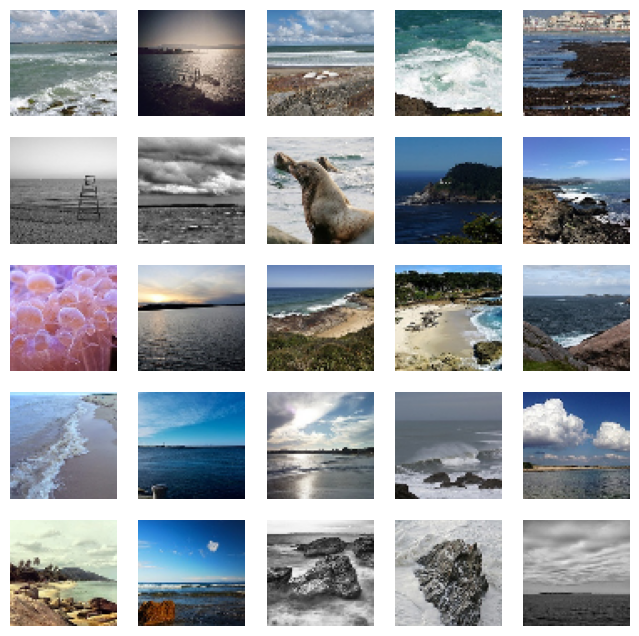

In [27]:
# Fazendo uma vizualização das imagens do nosso dataset
# Making a visualization of the images of our dataset
_,ax = plt.subplots(5,5, figsize = (8,8)) 
for i in range(5):
    for j in range(5):
        ax[i,j].imshow(images[5*i+j])
        ax[i,j].axis('off')

#### Construção da classe GAN

In [28]:
'''A função init ,também chamada de "método construtor", possui a responsabilidade de criar o objeto daquela classe. 
Nela será contida todas as informações principais do objeto. Nesse caso a GAN // 
  The init function, also called the "constructor method", is responsible for creating the object of that class.
It will contain all the main information of the object. In this case, the GAN'''

class GAN():
    def __init__(self):
        self.img_shape = (64, 64, 3)
        
        self.noise_size = 100

        optimizer = tf.keras.optimizers.legacy.Adam(0.0002,0.5)

        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy', 
                                   optimizer=optimizer,
                                   metrics=['accuracy'])

        self.generator = self.build_generator()
        self.generator.compile(loss='binary_crossentropy', optimizer=optimizer)
        
        self.combined = Sequential()
        self.combined.add(self.generator)
        self.combined.add(self.discriminator)
        
        self.discriminator.trainable = False
        
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)
        
        self.combined.summary()
        
    # Criando o gerador, os grandes kernels nas camadas convolucionais permitem que a rede crie estruturas complexas
    # Creating the generator, the large kernels in the convolutional layers allow the network to create complex structures
    def build_generator(self):
        epsilon = 0.00001 # Pequeno flutuador adicionado à variância para evitar a divisão por zero nas camadas BatchNormalization. / Small float added to variance to avoid division by zero in BatchNormalization layers.
        noise_shape = (self.noise_size,)
        
        model = Sequential()
        
        model.add(Dense(4*4*512, activation='linear', input_shape=noise_shape)) # pegando a quantidade total de pixel / getting the total amount of pixel
        model.add(LeakyReLU(alpha=0.2))
        model.add(Reshape((4, 4, 512))) # fazendo o reshape para matriz / reshaping the array
        
        model.add(Conv2DTranspose(512, kernel_size=[4,4], strides=[2,2], padding="same", #com matriz feita, passamaos os valores dos filtros para começar a fazer as camadas Conv2D / with the matrix done, we pass the values ​​of the filters to start making the Conv2D layers
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
        model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
        model.add(LeakyReLU(alpha=0.2))
        
        model.add(Conv2DTranspose(256, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
        model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
        model.add(LeakyReLU(alpha=0.2))
        
        model.add(Conv2DTranspose(128, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
        model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
        model.add(LeakyReLU(alpha=0.2))
        
        model.add(Conv2DTranspose(64, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
        model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
        model.add(LeakyReLU(alpha=0.2))
        
        model.add(Conv2DTranspose(3, kernel_size=[4,4], strides=[1,1], padding="same",
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))

        # Ativação padrão para uma estrutura de GAN / standart GAN activation
        model.add(Activation("tanh"))
        
        model.summary()

        noise = Input(shape=noise_shape)
        img = model(noise)

        return Model(noise, img)
    
    # Aqui construimos nosso discriminador, ele usara as imagens reais como um padrão comparativo. / Here we build our discriminator, it will use the real images as a comparative standard.
    # Se nosso gerador não construir algo que seja parecido com o que nosso discriminador foi treinado, o discriminador não irá deixar passar essa imagem. 
    # If our generator doesn't build something that looks like what our discriminator was trained on, the discriminator won't pass that image.
    def build_discriminator(self):

        model = Sequential()

        model.add(Conv2D(128, (3,3), padding='same', input_shape=self.img_shape))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization())
        model.add(Conv2D(128, (3,3), padding='same'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(3,3)))
        model.add(Dropout(0.2))

        model.add(Conv2D(128, (3,3), padding='same'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization())
        model.add(Conv2D(128, (3,3), padding='same'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(3,3)))
        model.add(Dropout(0.3))

        model.add(Flatten())
        model.add(Dense(128))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(128))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))
        
        model.summary()
        
        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, metrics_update=50, save_images=100, save_model=2000):

        X_train = np.array(images)
        X_train = (X_train.astype(np.float32) - 127.5) / 127.5

        half_batch = int(batch_size / 2)
        
        mean_d_loss=[0,0]
        mean_g_loss=0

        for epoch in range(epochs):
            idx = np.random.randint(0, X_train.shape[0], half_batch)
            imgs = X_train[idx]

            noise = np.random.normal(0, 1, (half_batch, self.noise_size))
            gen_imgs = self.generator.predict(noise)

            # Treinando o discriminador / Training discriminator
            
            # A perda do discriminador é a média das perdas durante o treinamento em imagens verdadeiras e falsas
            # Discriminator loss is the average loss during training on true and false images
            d_loss = 0.5 * np.add(self.discriminator.train_on_batch(imgs, np.ones((half_batch, 1))),
                                  self.discriminator.train_on_batch(gen_imgs, np.zeros((half_batch, 1))))

            # Treinando o gerador / Training Generator
            for _ in range(2):
                noise = np.random.normal(0, 1, (batch_size, self.noise_size))

                valid_y = np.array([1] * batch_size)
                g_loss = self.combined.train_on_batch(noise, valid_y)
            
            mean_d_loss[0] += d_loss[0]
            mean_d_loss[1] += d_loss[1]
            mean_g_loss += g_loss
            
            '''Será printado as losses e accuracy da network a cada 200 batches principalmente para ter certeza se a acuracia do discriminador
        não está estavel entre 50% ou 100% (o que pode significar que o discriminador não está performando muito bem)'''

            if epoch % metrics_update == 0:
                print ("%d [Loss do discriminador: %f, acc.: %.2f%%] [Loss do gerador: %f]" % (epoch, mean_d_loss[0]/metrics_update, 100*mean_d_loss[1]/metrics_update, mean_g_loss/metrics_update))
                mean_d_loss=[0,0]
                mean_g_loss=0
            
            # Salvando images / Saving Images
            if epoch % save_images == 0:
                self.save_images(epoch)
            
            # Temos a arquitetura do modelo, os pesos e o estado do otimizador / We have the model architecture, weights and optimizer state
            # Dessa forma podemos reiniciar o treino exatamente onde foi parado / That way we can restart the training exactly where it was stopped
            if epoch % save_model == 0:
                self.generator.save("generator_%d" % epoch)
                self.discriminator.save("discriminator_%d" % epoch)

    # salvando 25 imagens geradas para ter a representação do espectros de imagem criadas pelo nosso gerador
    # saving 25 generated images to have the representation of the image spectra created by our generator
    def save_images(self, epoch):
        noise = np.random.normal(0, 1, (25, self.noise_size))
        gen_imgs = self.generator.predict(noise)
        
        # redimencionando de [-1,1] para [0,1] / resizing from [-1,1] to [0,1]
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(5,5, figsize = (8,8))

        for i in range(5):
            for j in range(5):
                axs[i,j].imshow(gen_imgs[5*i+j])
                axs[i,j].axis('off')

        plt.show()
        
        fig.savefig("IntelGenerated/Ambient_%d.png" % epoch)
        plt.close()

In [29]:
# Criando um diretorio para as imagens geradas pela GAN / Creating a directory for images generated by GAN
! mkdir IntelGenerated

#### Treinando GAN

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 128)       3584      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 64, 64, 128)       0         
                                                                 
 batch_normalization (BatchN  (None, 64, 64, 128)      512       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 128)       147584    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 128)       0         
                                                                 
 batch_normalization_1 (Batc  (None, 64, 64, 128)      512       
 hNormalization)                                        

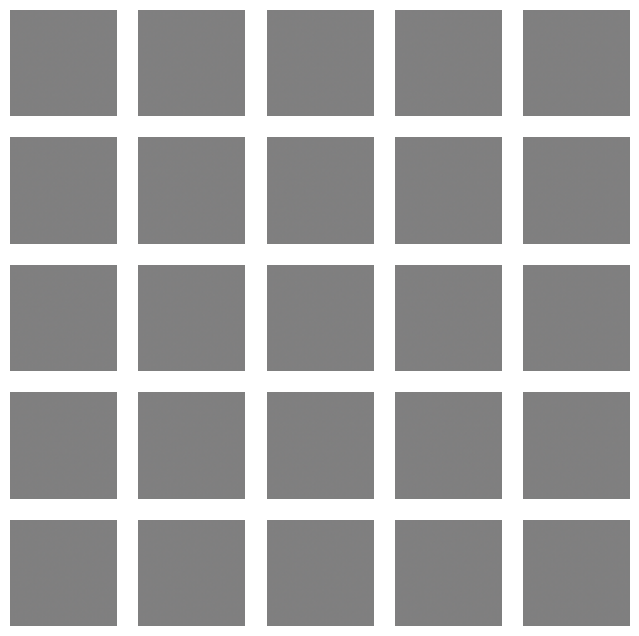

4/4 [==============================] - 0s 15ms/step
200 [Loss do discriminador: 0.579629, acc.: 71.43%] [Loss do gerador: 1.370460]
1/1 [==============================] - 0s 21ms/step


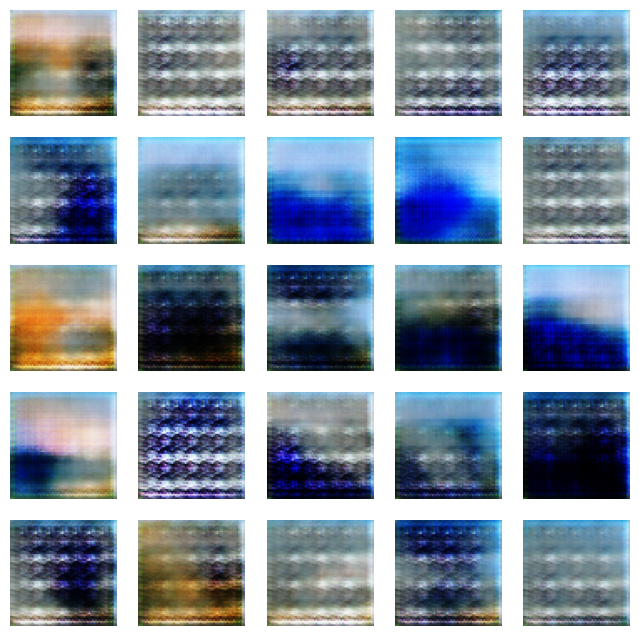

4/4 [==============================] - 0s 13ms/step
400 [Loss do discriminador: 0.569121, acc.: 70.55%] [Loss do gerador: 1.164736]
1/1 [==============================] - 0s 18ms/step


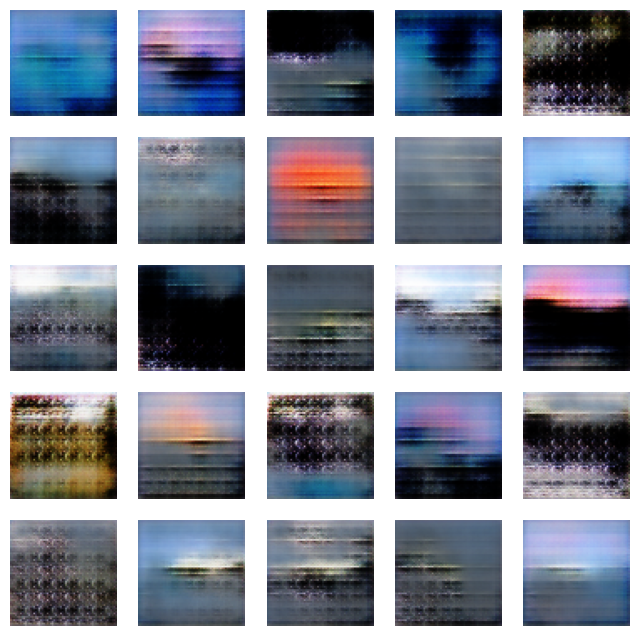

4/4 [==============================] - 0s 14ms/step
600 [Loss do discriminador: 0.542516, acc.: 73.09%] [Loss do gerador: 1.209814]
1/1 [==============================] - 0s 19ms/step


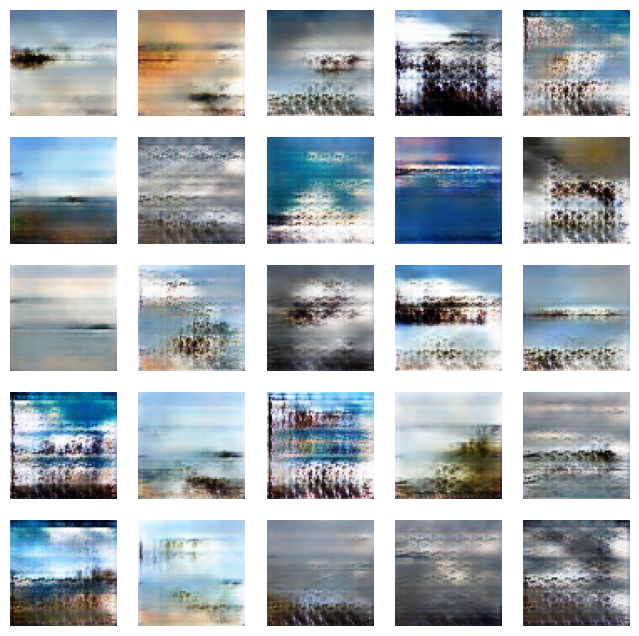

4/4 [==============================] - 0s 14ms/step
800 [Loss do discriminador: 0.457482, acc.: 80.97%] [Loss do gerador: 1.502972]
1/1 [==============================] - 0s 20ms/step


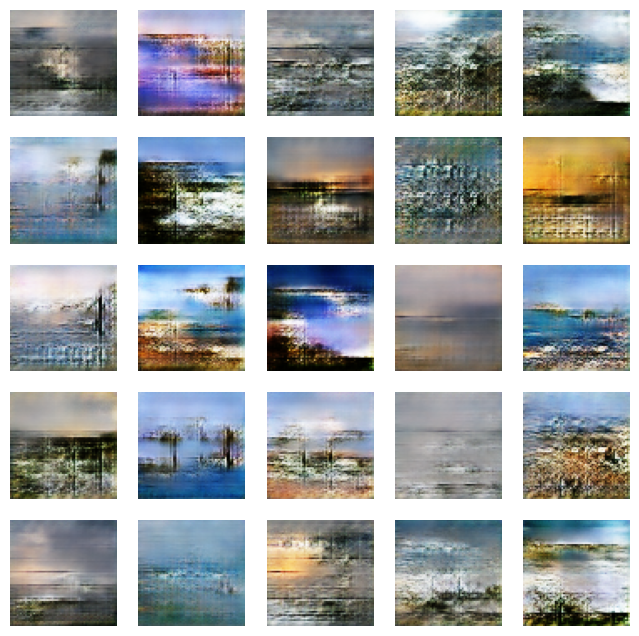

4/4 [==============================] - 0s 14ms/step
1000 [Loss do discriminador: 0.347615, acc.: 88.63%] [Loss do gerador: 1.917770]
1/1 [==============================] - 0s 27ms/step


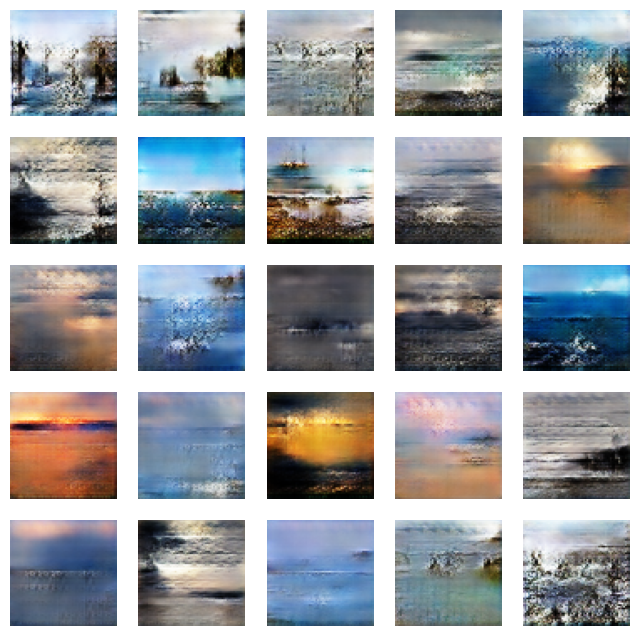

4/4 [==============================] - 0s 13ms/step
1200 [Loss do discriminador: 0.248603, acc.: 93.49%] [Loss do gerador: 2.449912]
1/1 [==============================] - 0s 19ms/step


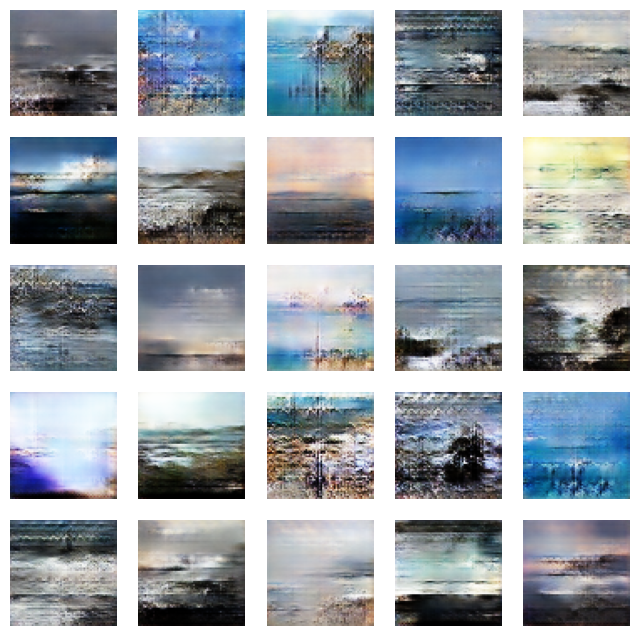

4/4 [==============================] - 0s 13ms/step
1400 [Loss do discriminador: 0.175731, acc.: 96.02%] [Loss do gerador: 3.002663]
1/1 [==============================] - 0s 20ms/step


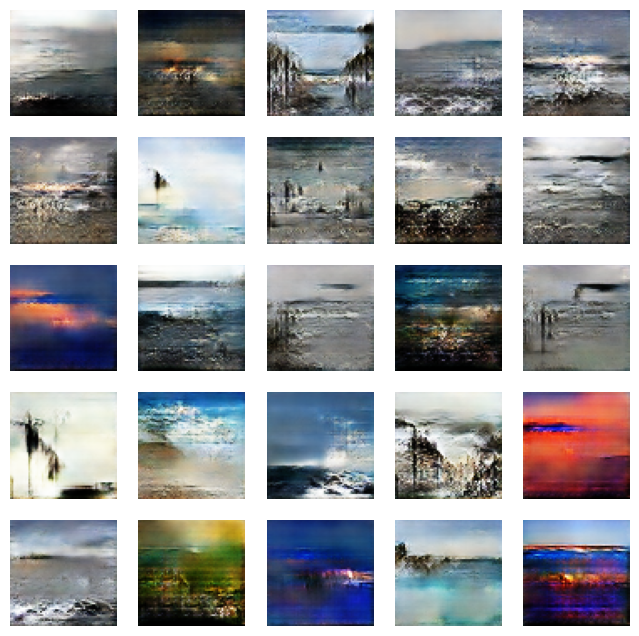

4/4 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 16ms/step
1600 [Loss do discriminador: 0.125645, acc.: 97.56%] [Loss do gerador: 3.585256]
1/1 [==============================] - 0s 20ms/step


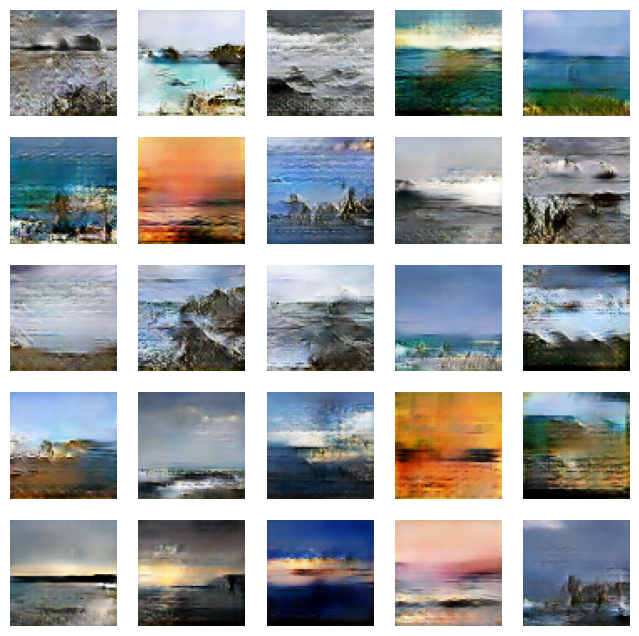

4/4 [==============================] - 0s 13ms/step
1800 [Loss do discriminador: 0.089190, acc.: 98.31%] [Loss do gerador: 4.186843]
1/1 [==============================] - 0s 20ms/step


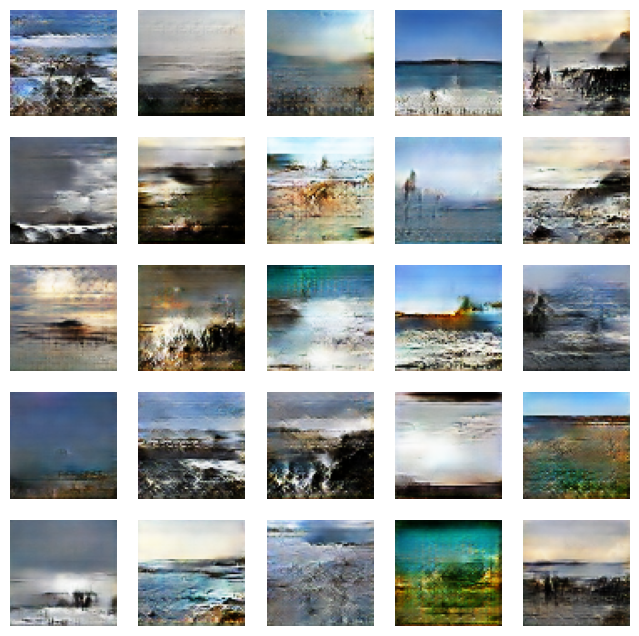

4/4 [==============================] - 0s 14ms/step
2000 [Loss do discriminador: 0.065850, acc.: 98.83%] [Loss do gerador: 4.698427]
1/1 [==============================] - 0s 23ms/step


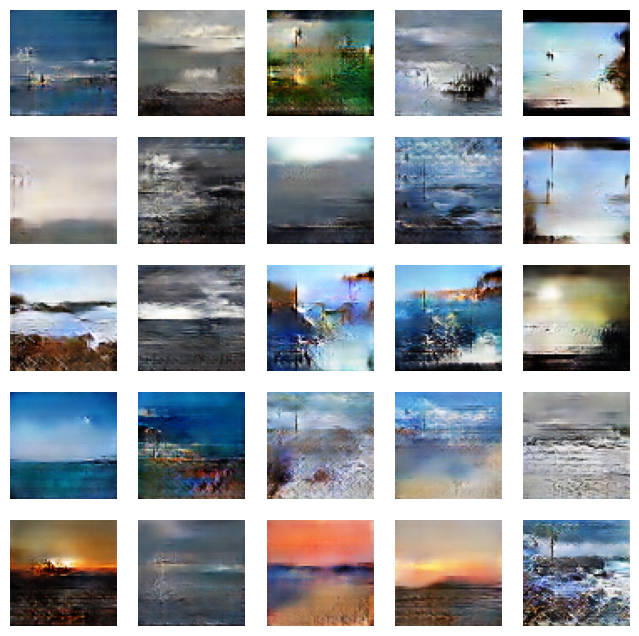

4/4 [==============================] - 0s 14ms/step
2200 [Loss do discriminador: 0.058013, acc.: 98.78%] [Loss do gerador: 5.114093]
1/1 [==============================] - 0s 19ms/step


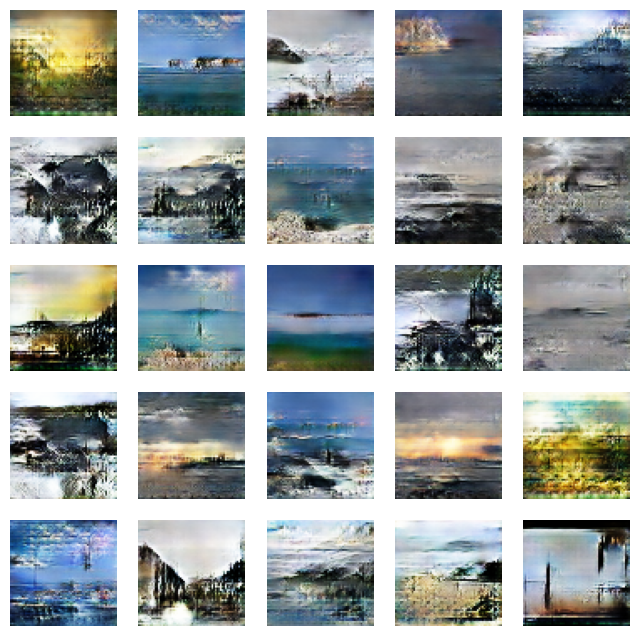

4/4 [==============================] - 0s 14ms/step
2400 [Loss do discriminador: 0.086709, acc.: 98.09%] [Loss do gerador: 5.590689]
1/1 [==============================] - 0s 21ms/step


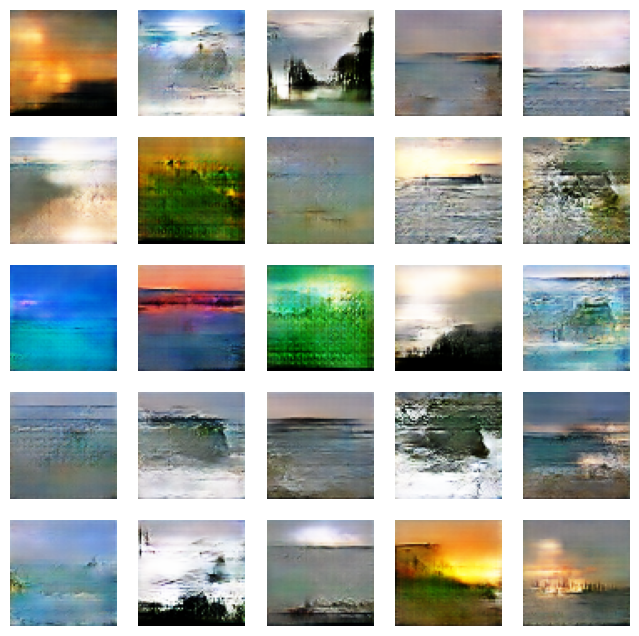

4/4 [==============================] - 0s 13ms/step
2600 [Loss do discriminador: 0.079263, acc.: 97.93%] [Loss do gerador: 4.887880]
1/1 [==============================] - 0s 28ms/step


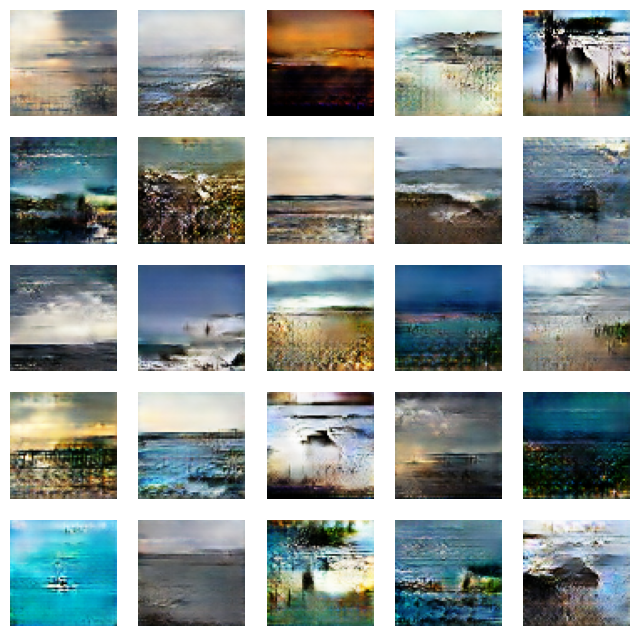

4/4 [==============================] - 0s 13ms/step
2800 [Loss do discriminador: 0.025852, acc.: 99.54%] [Loss do gerador: 6.023729]
1/1 [==============================] - 0s 18ms/step


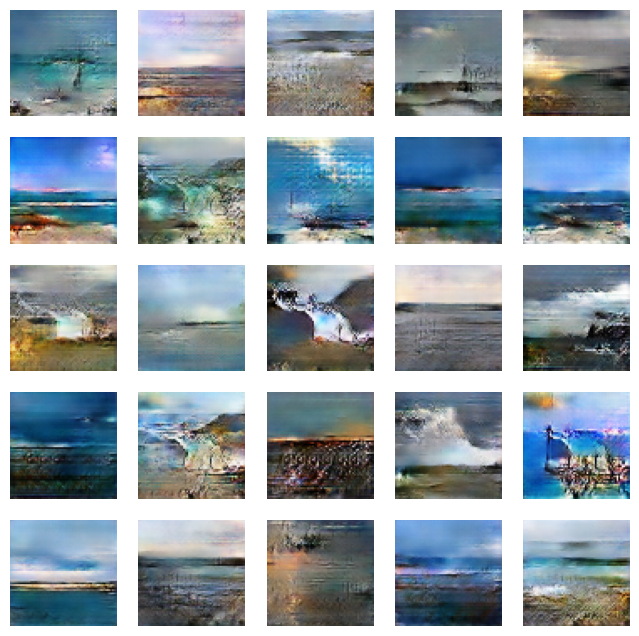

4/4 [==============================] - 0s 14ms/step
3000 [Loss do discriminador: 0.024022, acc.: 99.53%] [Loss do gerador: 6.622938]
1/1 [==============================] - 0s 18ms/step


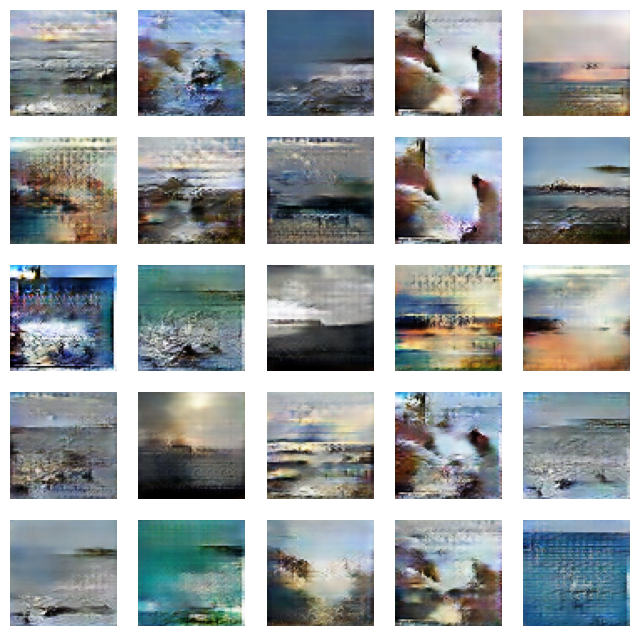

4/4 [==============================] - 0s 13ms/step
3200 [Loss do discriminador: 0.024736, acc.: 99.41%] [Loss do gerador: 6.906215]
1/1 [==============================] - 0s 20ms/step


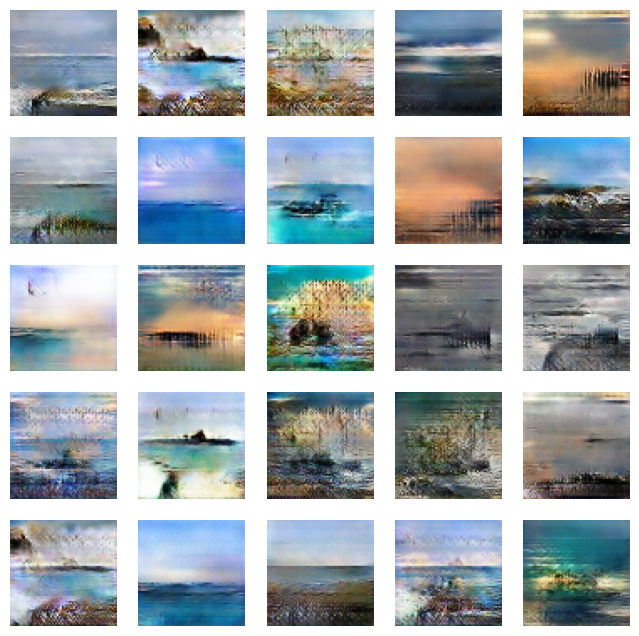

In [30]:
gan = GAN()
gan.train(epochs=3201, batch_size=256, metrics_update=200, save_images=200, save_model=1500)

#### Criando GIF dos resultados / Creating GIF from the results

- **Observação**: como foi usado o modelo gratuito do GoogleColab, as epocas de treinamento foram limitadas para que todo o projeto fosse processado e nao fosse barrado pelo Colab. Mesmo assim é possivel ver a evolução do moedelo em gerar imagens dadas para ele.
- **Observation**: as the free GoogleColab model was used, the training epochs were limited so that the entire project could be processed and not be interrupted by Colab. Even so, it is possible to see the evolution of the model in generating images given to it.

In [31]:
import imageio

In [32]:
import imageio
import os

# Nome do arquivo GIF a ser criado / Name of the GIF file to be created
gif_name = 'generated_images.gif'

# Caminho para a pasta que contém as imagens geradas / Path to the folder containing the generated images
image_folder = '/content/IntelGenerated'

# Obtendo a lista de nomes de arquivos de imagens na pasta / Getting list of image filenames in folder
images = sorted(os.listdir(image_folder))

# Criando uma lista com os caminhos completos de cada imagem / Creating a list with the full paths of each image
image_paths = [os.path.join(image_folder, file_name) for file_name in images]

# Definindo duração dos gifs / Setting duration of gifs
duracao = 0.5

# Criando o arquivo GIF usando a lista de caminhos das imagens / Creating GIF file using image path list
with imageio.get_writer(gif_name, mode='I', duration = duracao) as writer:
    for image_path in image_paths:
        image = imageio.imread(image_path)
        writer.append_data(image)

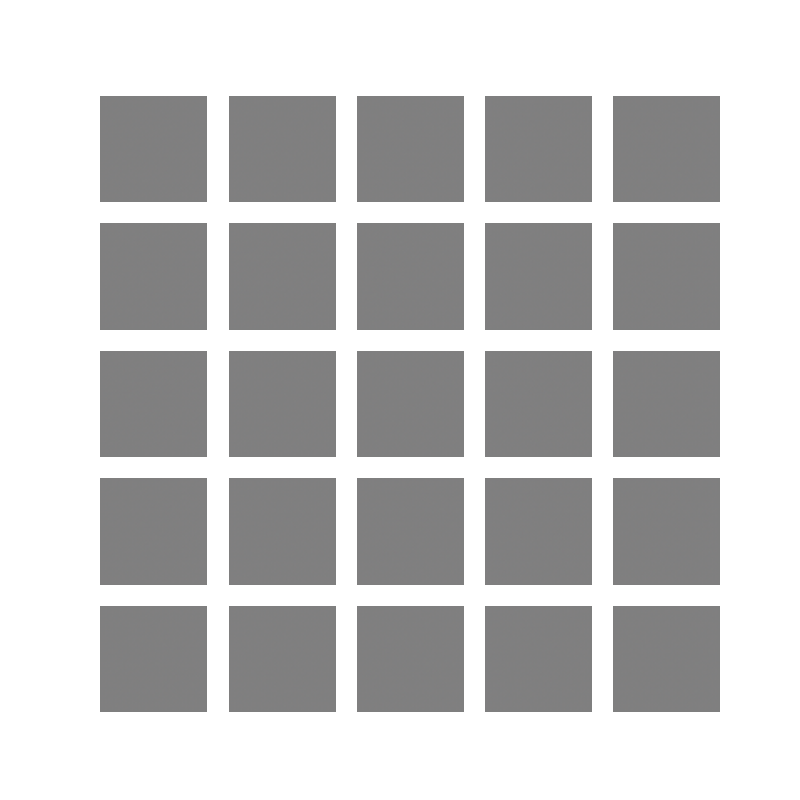

In [33]:
from IPython.display import display, Image
with open('generated_images.gif','rb') as f:
    display(Image(data=f.read(), format='png'))

# Build CNN models for Landscape Multi Classification

### Check GPU

In [34]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-ac47d4bf-21aa-5197-7e18-5249fee6b4a7)


In [35]:
!nvidia-smi

Sat Apr  8 19:37:18 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   69C    P0    29W /  70W |  14541MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### Unziped images

In [36]:
import zipfile

zip_ref= zipfile.ZipFile("/content/intel-image-classification.zip", "r")
zip_ref.extractall()
zip_ref.close()

### Explore Images

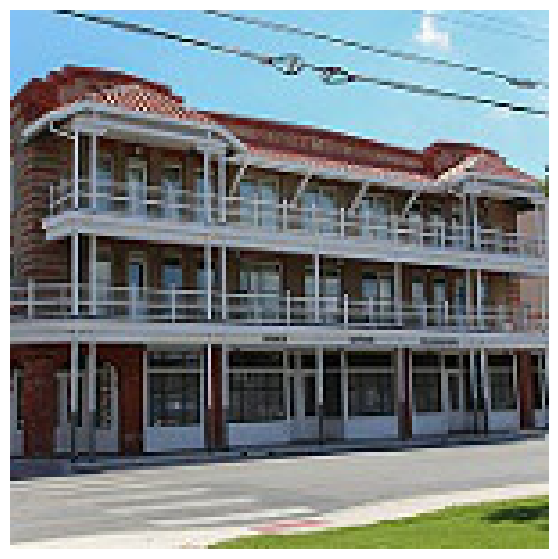

In [37]:
import random
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img = mpimg.imread("/content/seg_train/seg_train/buildings/1001.jpg")
plt.figure(figsize=(7,7))
plt.imshow(img)
plt.axis(False);

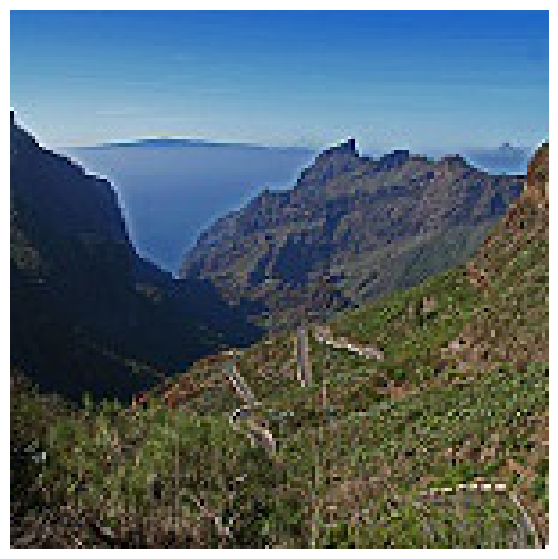

In [38]:
img = mpimg.imread("/content/seg_train/seg_train/mountain/10002.jpg")
plt.figure(figsize=(7,7))
plt.imshow(img)
plt.axis(False);

### Reduce train folder to 100 images of each category and transform image into data

In [39]:
!pip install split_folders
import splitfolders

input_folder = "/content/seg_train/seg_train"
output = "10_percent_train_data" 

splitfolders.fixed(input_folder, output, seed=42, fixed=(200,200,200))

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Copying files: 3600 files [00:00, 3959.07 files/s]


In [40]:
for dirpath, dirnames, filenames in os.walk("/content/10_percent_train_data/train"):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in {dirpath}")

There are 6 directories and 0 images in /content/10_percent_train_data/train
There are 0 directories and 200 images in /content/10_percent_train_data/train/buildings
There are 0 directories and 200 images in /content/10_percent_train_data/train/glacier
There are 0 directories and 200 images in /content/10_percent_train_data/train/street
There are 0 directories and 200 images in /content/10_percent_train_data/train/mountain
There are 0 directories and 200 images in /content/10_percent_train_data/train/forest
There are 0 directories and 200 images in /content/10_percent_train_data/train/sea


In [41]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

data_rescaled = ImageDataGenerator(rescale= 1/255.)

In [42]:
train_dir ="/content/10_percent_train_data/train"
val_dir = "/content/seg_test/seg_test/"
test_dir = "/content/seg_pred/seg_pred/"

In [43]:
import pathlib
import numpy as np
data_dir = pathlib.Path(train_dir)
class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))
print(class_names)

['buildings' 'forest' 'glacier' 'mountain' 'sea' 'street']


In [44]:
tf.random.set_seed(42)

TARGET_SIZE = (224,224)
BATCH_SIZE = 32

train_data = data_rescaled.flow_from_directory(directory=train_dir,
                                               batch_size=BATCH_SIZE,
                                               target_size=TARGET_SIZE,
                                               class_mode="categorical",
                                               shuffle=True)

val_data = data_rescaled.flow_from_directory(directory=val_dir,
                                             target_size=TARGET_SIZE,
                                             batch_size=BATCH_SIZE,
                                             class_mode="categorical",
                                             shuffle=False)

Found 1200 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [45]:
len(train_data)

38

### Explore data

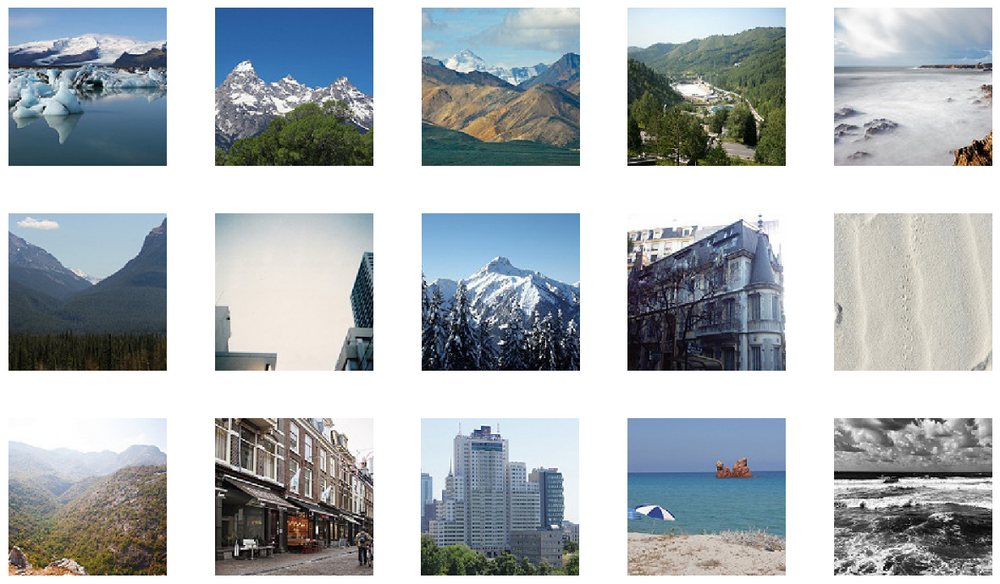

In [46]:
labels=[key for key in train_data.class_indices]
# print(labels)
samples=train_data.__next__()

images=samples[0]
targets=samples[1]
plt.figure(figsize=(15,15))
for i in range(15):

    plt.subplot(5,5,i+1)
    plt.subplots_adjust(hspace=0.3,wspace=.3)
    plt.imshow(images[i])
    plt.axis('off')

### Model_1 CNN with regular train data

In [47]:
len(class_names)

6

In [48]:
model_1 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(50, 3, activation='relu', input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(40, 3, activation='relu'),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Conv2D(30, 3, activation='relu', input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(20, 3, activation='relu'),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(len(class_names), activation='softmax')
]) 

model_1.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 222, 222, 50)      1400      
                                                                 
 conv2d_5 (Conv2D)           (None, 220, 220, 40)      18040     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 110, 110, 40)     0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 108, 108, 30)      10830     
                                                                 
 conv2d_7 (Conv2D)           (None, 106, 106, 20)      5420      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 53, 53, 20)       0         
 2D)                                                  

In [49]:
model_1.compile(loss="categorical_crossentropy",
                optimizer = tf.keras.optimizers.Adam(),
                metrics=['accuracy'])

In [50]:
history_1 = model_1.fit(train_data,
                        epochs=5,
                        validation_data=val_data,
                        validation_steps=len(val_data))

Epoch 1/5
38/38 [==============================] - 35s 784ms/step - loss: 1.5975 - accuracy: 0.3192 - val_loss: 1.3170 - val_accuracy: 0.4787
Epoch 2/5
38/38 [==============================] - 13s 338ms/step - loss: 1.1005 - accuracy: 0.5850 - val_loss: 1.0568 - val_accuracy: 0.5877
Epoch 3/5
38/38 [==============================] - 12s 310ms/step - loss: 0.7384 - accuracy: 0.7408 - val_loss: 1.0214 - val_accuracy: 0.6260
Epoch 4/5
38/38 [==============================] - 11s 293ms/step - loss: 0.4337 - accuracy: 0.8458 - val_loss: 1.7568 - val_accuracy: 0.5223
Epoch 5/5
38/38 [==============================] - 10s 265ms/step - loss: 0.2969 - accuracy: 0.9017 - val_loss: 1.6356 - val_accuracy: 0.5890


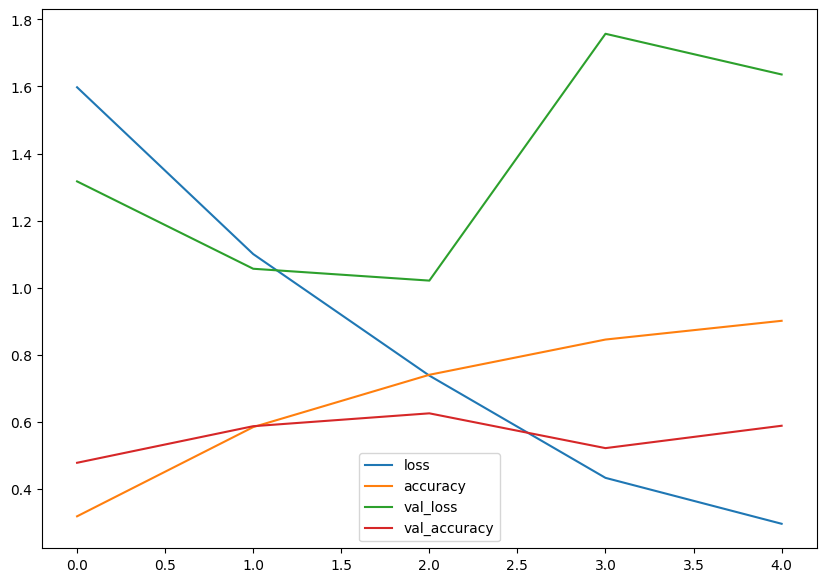

In [51]:
import pandas as pd
pd.DataFrame(history_1.history).plot(figsize=(10, 7));

In [52]:
model_1.evaluate(val_data)

94/94 [==============================] - 7s 71ms/step - loss: 1.6356 - accuracy: 0.5890


[1.6355910301208496, 0.5889999866485596]

### Model_2 CNN with augmented train data

In [53]:
data_augmented = ImageDataGenerator(rescale = 1/255.,
                                    rotation_range = 20,
                                    shear_range = 0.2,
                                    zoom_range= 0.2,
                                    width_shift_range=0.2,
                                    height_shift_range= 0.2,
                                    horizontal_flip=True)

In [54]:
train_data_aug = data_augmented.flow_from_directory(directory=train_dir,
                                               batch_size=BATCH_SIZE,
                                               target_size=TARGET_SIZE,
                                               class_mode="categorical",
                                               shuffle=True)

Found 1200 images belonging to 6 classes.


In [55]:
model_2 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(100, 3, activation='relu', input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(100, 3, activation='relu'),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Conv2D(80, 3, activation='relu', input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(60, 3, activation='relu'),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(len(class_names), activation='softmax')
]) 

model_2.summary()

model_2.compile(loss="categorical_crossentropy",
                optimizer = tf.keras.optimizers.Adam(),
                metrics=['accuracy'])

history_2 = model_2.fit(train_data_aug,
                        epochs=50,
                        validation_data=val_data,
                        validation_steps=len(val_data))

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 222, 222, 100)     2800      
                                                                 
 conv2d_9 (Conv2D)           (None, 220, 220, 100)     90100     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 110, 110, 100)    0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 108, 108, 80)      72080     
                                                                 
 conv2d_11 (Conv2D)          (None, 106, 106, 60)      43260     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 53, 53, 60)       0         
 2D)                                                  

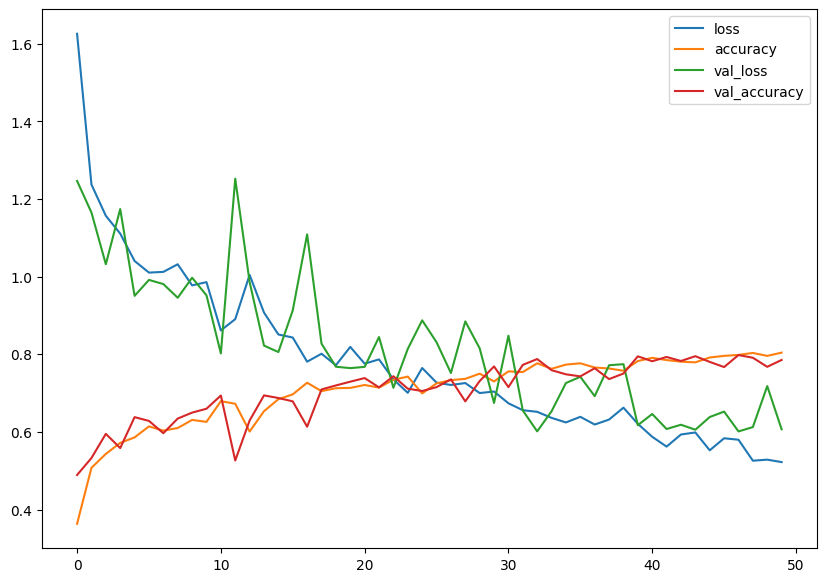

In [56]:
pd.DataFrame(history_2.history).plot(figsize=(10, 7));

In [57]:
model_2.evaluate(val_data)

94/94 [==============================] - 8s 81ms/step - loss: 0.6067 - accuracy: 0.7853


[0.6066817045211792, 0.7853333353996277]

### Model_3 CNN with augmented train data and Callbacks


1.   ModelCheckpoint
2.   ReduceLRONPlateau
3.   EarlyStopping

In [58]:
checkpoint_path = "model_checkpoints/cp.ckpt"
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                      monitor="val_accuracy",
                                                      save_best_only=True, # only save the best weights
                                                      save_weights_only=True, # only save model weights (not whole model)
                                                      verbose=0) 

In [59]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", 
                                                  patience=3)

In [60]:
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss",  
                                                 factor=0.2, # multiply the learning rate by 0.2 (reduce by 5x)
                                                 patience=2,
                                                 verbose=1, # print out when learning rate goes down 
                                                 min_lr=1e-7)

In [61]:
model_3 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(200, 3, activation='relu', input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(200, 3, activation='relu'),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Conv2D(150, 3, activation='relu', input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(50, 3, activation='relu'),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(len(class_names), activation='softmax')
]) 

model_3.summary()

model_3.compile(loss="categorical_crossentropy",
                optimizer = tf.keras.optimizers.Adam(),
                metrics=['accuracy'])

history_3 = model_3.fit(train_data_aug,
                        epochs=100,
                        validation_data=val_data,
                        validation_steps=len(val_data),
                        callbacks=[model_checkpoint,
                                   early_stopping])

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 222, 222, 200)     5600      
                                                                 
 conv2d_13 (Conv2D)          (None, 220, 220, 200)     360200    
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 110, 110, 200)    0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 108, 108, 150)     270150    
                                                                 
 conv2d_15 (Conv2D)          (None, 106, 106, 50)      67550     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 53, 53, 50)       0         
 2D)                                                  

In [62]:
checkpoint_path

'model_checkpoints/cp.ckpt'

In [63]:
cloned_model = tf.keras.models.clone_model(model_3)
cloned_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 222, 222, 200)     5600      
                                                                 
 conv2d_13 (Conv2D)          (None, 220, 220, 200)     360200    
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 110, 110, 200)    0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 108, 108, 150)     270150    
                                                                 
 conv2d_15 (Conv2D)          (None, 106, 106, 50)      67550     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 53, 53, 50)       0         
 2D)                                                  

In [64]:
cloned_model.compile(loss="categorical_crossentropy",
                     optimizer=tf.keras.optimizers.Adam(),
                     metrics=["accuracy"])

In [65]:
cloned_model.load_weights(checkpoint_path)

In [66]:
results_model_3_loaded_weights = cloned_model.evaluate(val_data)

94/94 [==============================] - 21s 223ms/step - loss: 0.8796 - accuracy: 0.6663


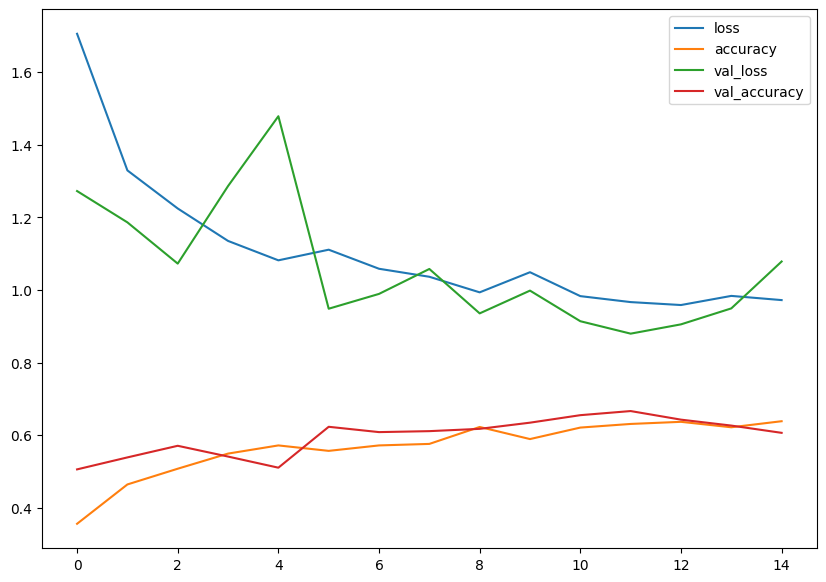

In [67]:
pd.DataFrame(history_3.history).plot(figsize=(10, 7));